In [ ]:
from google.colab import files
uploaded = files.upload()


Saving Dataset .csv to Dataset .csv


In [ ]:
import pandas as pd

# Loading the dataset
file_path = 'Dataset .csv'
df = pd.read_csv(file_path)

# Showing first few rows and columns
print(df.head())
print(df.columns)


   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [ ]:
# Step 1: Plotting the restaurant locations on a map
import pandas as pd
import folium

# Loading the dataset
df = pd.read_csv('Dataset .csv')

# Using correct column names (case-sensitive)
latitude_col = 'Latitude'
longitude_col = 'Longitude'

# Dropping rows with missing coordinates
df = df.dropna(subset=[latitude_col, longitude_col])

# Creating a map centered on the average location
map_center = [df[latitude_col].mean(), df[longitude_col].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Adding restaurant markers
for _, row in df.iterrows():
    folium.Marker(
        location=[row[latitude_col], row[longitude_col]],
        popup=row.get('Restaurant Name', 'Restaurant')
    ).add_to(restaurant_map)

# Display it on the map
restaurant_map



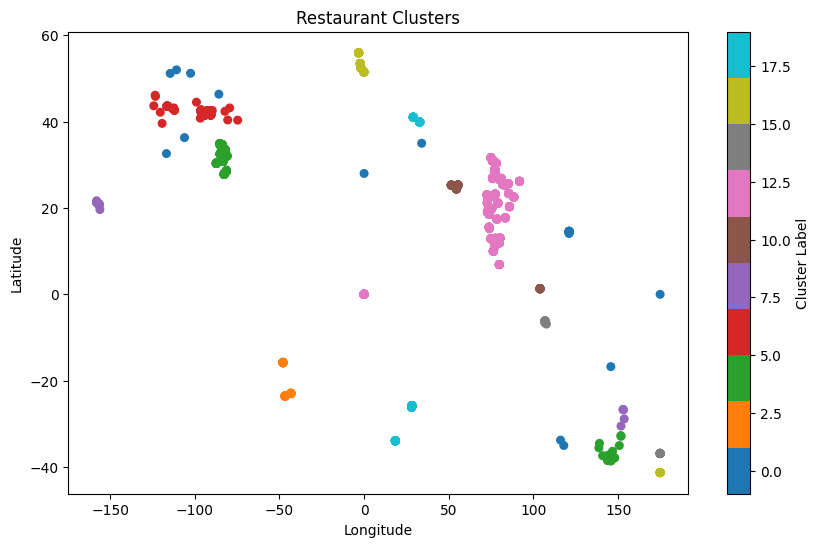

In [ ]:
# Step 2: Identifying clusters of restaurants
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Extracting the coordinates
coords = df[[latitude_col, longitude_col]].values

# Standardize the coordinates
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(coords)

# Apply DBSCAN clustering
db = DBSCAN(eps=0.3, min_samples=5).fit(coords_scaled)
labels = db.labels_

# Adding cluster labels to DataFrame
df['cluster'] = labels

# Plotting the clusters
plt.figure(figsize=(10, 6))
plt.scatter(df[longitude_col], df[latitude_col], c=labels, cmap='tab10', s=30)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Restaurant Clusters')
plt.colorbar(label='Cluster Label')
plt.show()
